In [1]:
! pip install bnlp-toolkit==1.1.0
! pip install BnLemma

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 41.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.2.2 which is incompatible.
plotnine 0.14.5 requires matplotlib>=3.8.0, but you have matplotlib 3.7.2 which is incompat

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from bnlp.basic_tokenizer import BasicTokenizer
import numpy as np
import warnings
import re
from PIL import Image
from wordcloud import WordCloud
import BnLemma as lm
from tqdm.notebook import tqdm
from bs4 import BeautifulSoup

warnings.filterwarnings("ignore")
%matplotlib inline

In [3]:
wordcloud_mask=np.array(Image.open("/kaggle/input/wordcloud-mask-collection/twitter.png"))
my_font="/kaggle/input/elegant-and-functional-fonts/Ador Noirrit Web.otf"

In [4]:
df1=pd.read_csv("/kaggle/input/bengali-and-english-news-dataset-for-analysis/final_bn_data.csv")

In [5]:
df1.head()

,category,headline,content,label
0,National,৮ দিনে ১৮ বিল পাস!,দশম জাতীয় সংসদের মেয়াদ শেষ হয়ে যাচ্ছে। কার্যত ...,0.0
1,Sports,আ’লীগের জনসভায় লোকে লোকারণ্য ফেনী ট্রাংক রোড,একাদশ জাতীয় সংসদ নির্বাচনকে সামনে রেখে সাংগঠনি...,0.0
2,National,মাদ্রাসায় জোড়া খুন: পরিচালক তিন দিনের রিমান্ডে,গাজীপুরে জোড়া খুন মামলার প্রধান আসামি মাদ্রাসা...,0.0
3,Sports,নেপালকে হারিয়ে গ্রুপ চ্যাম্পিয়ন বাংলাদেশ,সাফ অনূর্ধ্ব-১৮ নারী ফুটবল চ্যাম্পিয়নশিপে নেপা...,1.0
4,National,কুড়িগ্রামে ২ শিক্ষার্থীর লাশ উদ্ধার,কুড়িগ্রাম প্রতিনিধি : কুড়িগ্রাম সদর উপজেলার বে...,1.0


In [6]:
df1.shape

(14537, 4)

In [7]:
df1.isnull().sum()

category    0
headline    0
content     0
label       0
dtype: int64

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14537 entries, 0 to 14536
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   category  14537 non-null  object 
 1   headline  14537 non-null  object 
 2   content   14537 non-null  object 
 3   label     14537 non-null  float64
dtypes: float64(1), object(3)
memory usage: 454.4+ KB


In [9]:
df1["text"]=df1["headline"]+" "+df1["content"]

In [10]:
df1.drop(columns=["headline","content"],axis=1,inplace=True)

In [11]:
df1.head()

,category,label,text
0,National,0.0,৮ দিনে ১৮ বিল পাস! দশম জাতীয় সংসদের মেয়াদ শেষ ...
1,Sports,0.0,আ’লীগের জনসভায় লোকে লোকারণ্য ফেনী ট্রাংক রোড এ...
2,National,0.0,মাদ্রাসায় জোড়া খুন: পরিচালক তিন দিনের রিমান্ডে...
3,Sports,1.0,নেপালকে হারিয়ে গ্রুপ চ্যাম্পিয়ন বাংলাদেশ সাফ অ...
4,National,1.0,কুড়িগ্রামে ২ শিক্ষার্থীর লাশ উদ্ধার কুড়িগ্রাম ...


In [12]:
df2=pd.read_csv("/kaggle/input/banfakenews/Authentic-48K.csv")

In [13]:
df2.head()

,articleID,domain,date,category,headline,content,label
0,1,jagonews24.com,2018-09-19 17:48:18,Education,"হট্টগোল করায় বাকৃবিতে দুইজন বরখাস্ত, ৬ জনকে শোকজ",গত ১৭ সেপ্টেম্বর বাংলাদেশ কৃষি বিশ্ববিদ্যালয়ে ...,1
1,2,jagonews24.com,2018-09-19 17:48:19,National,মালয়েশিয়ায় কর্মী পাঠানোর ব্যবস্থা নেয়ার সুপারিশ,বাংলাদেশের বৃহৎ শ্রমবাজার মালয়েশিয়ায় আবার শ্রম...,1
2,3,jagonews24.com,2018-09-19 17:48:20,National,প্রেমের প্রস্তাবে রাজি না হওয়ায় স্কুলছাত্রীকে ...,নরসিংদীর মনোহরদীতে প্রেমের প্রস্তাবে রাজি না হ...,1
3,4,jagonews24.com,2018-09-19 17:48:21,Crime,মেডিয়েশনই মামলাজট নিরসনের পথ : বিচারপতি আহমেদ ...,সুপ্রিম কোর্টের হাইকোর্ট বিভাগের বিচারপতি আহমে...,1
4,5,jagonews24.com,2018-09-19 17:48:21,National,টকশোতে বক্তব্য দিতে গিয়ে জাপা নেতার মৃত্যু,মাদারীপুর সদরের উপজেলার লেকেরপাড়ে একটি বেসরকার...,1


In [14]:
df2.drop(columns=["articleID","domain","date"],axis=1,inplace=True)

In [15]:
df2.shape

(48678, 4)

In [16]:
df2.isnull().sum()

category    0
headline    0
content     0
label       0
dtype: int64

In [17]:
df2["text"]=df2["headline"]+" "+df2["content"]

In [18]:
df2.drop(columns=["headline","content"],axis=1,inplace=True)

In [19]:
df2.head()

,category,label,text
0,Education,1,"হট্টগোল করায় বাকৃবিতে দুইজন বরখাস্ত, ৬ জনকে শো..."
1,National,1,মালয়েশিয়ায় কর্মী পাঠানোর ব্যবস্থা নেয়ার সুপারি...
2,National,1,প্রেমের প্রস্তাবে রাজি না হওয়ায় স্কুলছাত্রীকে ...
3,Crime,1,মেডিয়েশনই মামলাজট নিরসনের পথ : বিচারপতি আহমেদ ...
4,National,1,টকশোতে বক্তব্য দিতে গিয়ে জাপা নেতার মৃত্যু মাদ...


In [20]:
df3=pd.read_csv("/kaggle/input/banfakenews/Fake-1K.csv")

In [21]:
df3.head()

,articleID,domain,date,category,headline,content,label
0,1,channeldhaka.news,2019-03-14T13:34:14+00:00,International,মুরগির হামলায় শেয়াল নিহত,"বাংলায় একটা প্রবাদ আছে, শেয়ালের কাছে মুরগী বর্...",0
1,2,earki.com,"সেম্বর ১৭, ২০১৮",Miscellaneous,বিটিভিতে যেবার আমি ইন্টারভিউ দিতে গেলাম,"BTV থেকে লোকজন আসছে, ইন্টারভিউ নিবে।চারজনের টি...",0
2,3,earki.com,"২০:৩৯, জানুয়ারি ১৪, ২০১৯",Miscellaneous,বিদেশ থেকে উন্নতমানের বিরোধীদল আমদানি করার পরা...,অদ্ভুত বিরোধীদলহীনতায় ভুগছে সরকার। এ এক অন্যরক...,0
3,4,channeldhaka.news,2018-06-30T15:56:47+00:00,Sports,অবসর নেয়ার ঘোষণা দিলেন মেসি !,রাশিয়া বিশ্বকাপ নকআউট পর্বে ফ্রান্সের সাথে ৪-৩...,0
4,5,motikontho.wordpress.com,2013-03-05T21:55:45+00:00,Miscellaneous,"মাদারফাকার নহে, ব্রাদারফাকার: সাকা | দৈনিক মতি...","নিজস্ব মতিবেদক‘মাদারফাকার নহে, আমি ব্রাদারফাকা...",0


In [22]:
df3["text"]=df3["headline"]+" "+df3["content"]

In [23]:
df3.drop(columns=["articleID","domain","date","headline","content"],axis=1,inplace=True)

In [24]:
df3.head()

,category,label,text
0,International,0,মুরগির হামলায় শেয়াল নিহত বাংলায় একটা প্রবাদ আছ...
1,Miscellaneous,0,বিটিভিতে যেবার আমি ইন্টারভিউ দিতে গেলাম BTV থে...
2,Miscellaneous,0,বিদেশ থেকে উন্নতমানের বিরোধীদল আমদানি করার পরা...
3,Sports,0,অবসর নেয়ার ঘোষণা দিলেন মেসি ! রাশিয়া বিশ্বকাপ ...
4,Miscellaneous,0,"মাদারফাকার নহে, ব্রাদারফাকার: সাকা | দৈনিক মতি..."


In [25]:
bn_df= pd.concat([df1, df2, df3], ignore_index=True)


In [26]:
bn_df.head()

,category,label,text
0,National,0.0,৮ দিনে ১৮ বিল পাস! দশম জাতীয় সংসদের মেয়াদ শেষ ...
1,Sports,0.0,আ’লীগের জনসভায় লোকে লোকারণ্য ফেনী ট্রাংক রোড এ...
2,National,0.0,মাদ্রাসায় জোড়া খুন: পরিচালক তিন দিনের রিমান্ডে...
3,Sports,1.0,নেপালকে হারিয়ে গ্রুপ চ্যাম্পিয়ন বাংলাদেশ সাফ অ...
4,National,1.0,কুড়িগ্রামে ২ শিক্ষার্থীর লাশ উদ্ধার কুড়িগ্রাম ...


In [27]:
bn_df["label"].value_counts()

label
1.0    58678
0.0     5836
Name: count, dtype: int64

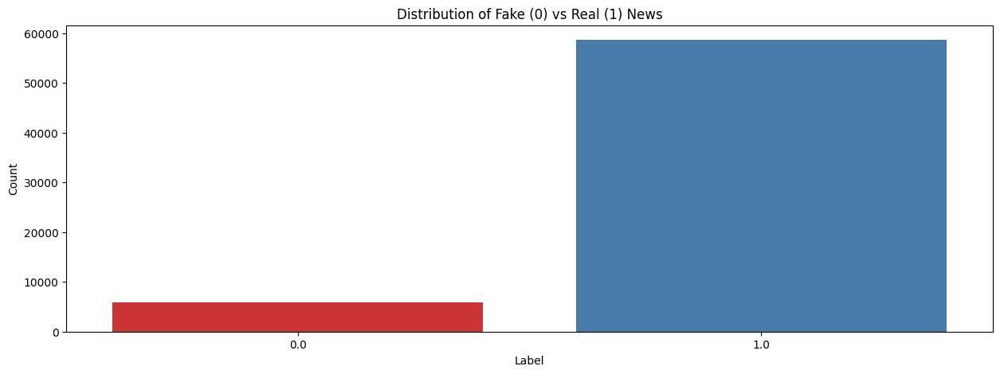

In [28]:
plt.figure(figsize=(15,5))
sns.countplot(x='label', data=bn_df,palette="Set1")

plt.title('Distribution of Fake (0) vs Real (1) News')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

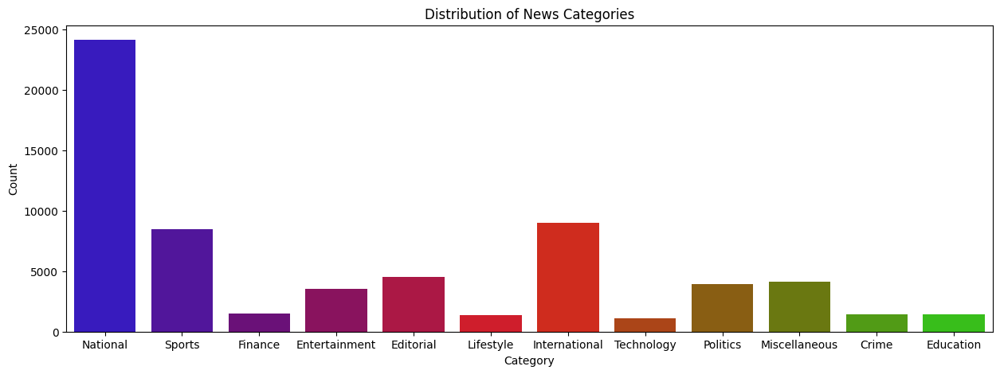

In [29]:
plt.figure(figsize=(15,5))
sns.countplot(x='category', data=bn_df,palette="brg")
plt.title('Distribution of News Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.show()

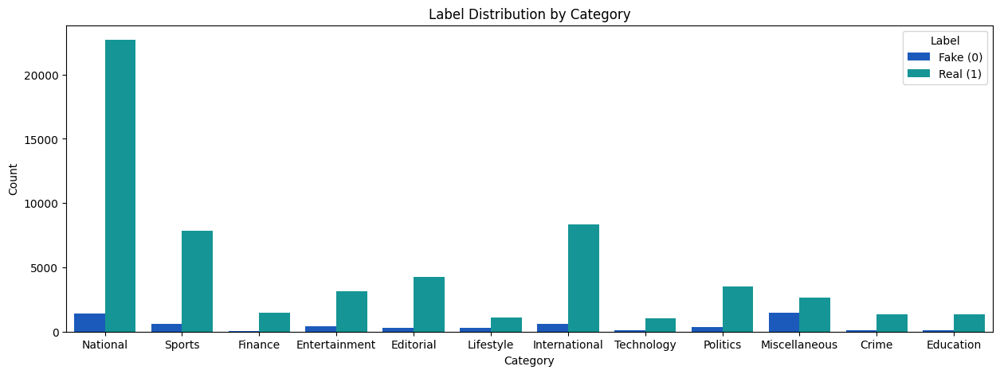

In [30]:
plt.figure(figsize=(15,5))
sns.countplot(x='category', hue='label', data=bn_df,palette="winter")
plt.title('Label Distribution by Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.legend(title='Label', labels=['Fake (0)', 'Real (1)'])
plt.show()

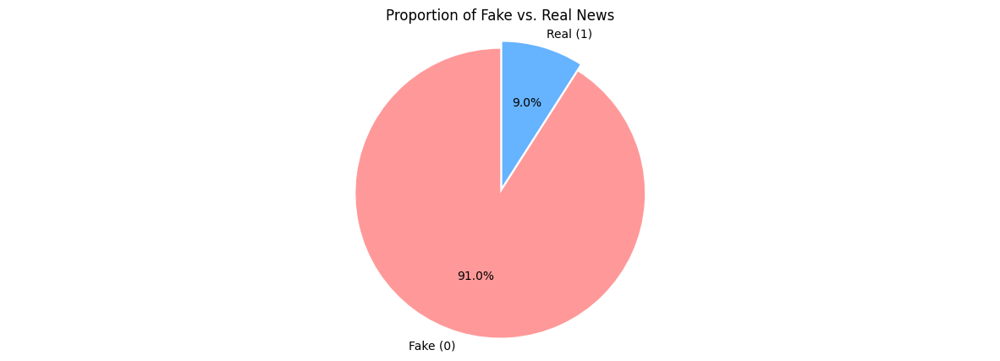

In [31]:
label_counts = bn_df['label'].value_counts()

plt.figure(figsize=(15,5))
plt.pie(label_counts, labels=['Fake (0)', 'Real (1)'],autopct='%1.1f%%',startangle=90,colors=['#ff9999','#66b3ff'],explode=(0.05, 0))
plt.title('Proportion of Fake vs. Real News')
plt.axis('equal')
plt.show()

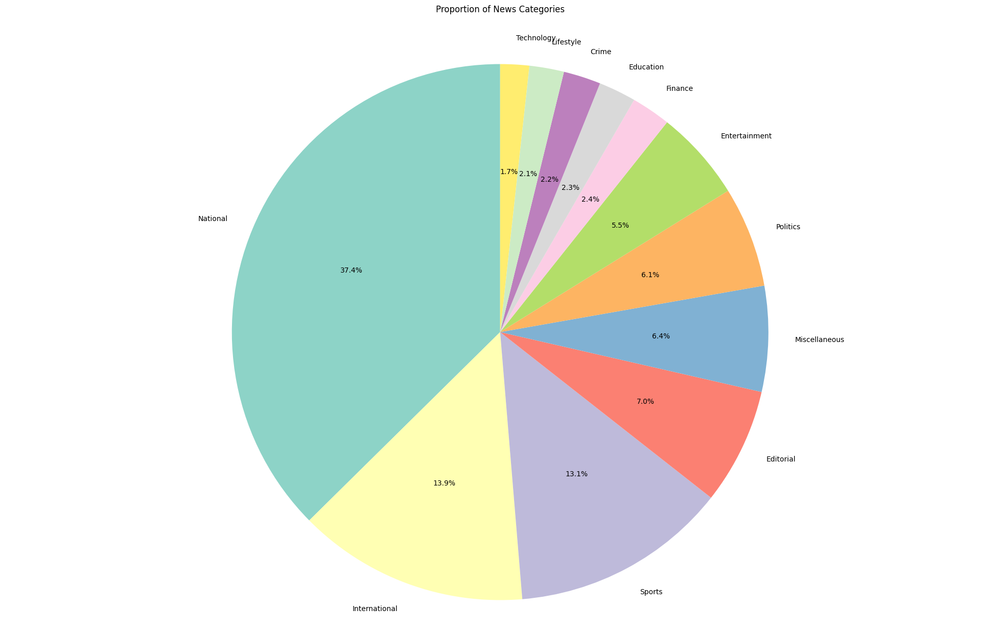

In [32]:
category_counts = bn_df['category'].value_counts()
colors = sns.color_palette("Set3", len(category_counts))
plt.figure(figsize=(25, 15))
plt.pie(category_counts,labels=category_counts.index,autopct='%1.1f%%',startangle=90,colors=colors)
plt.title('Proportion of News Categories\n\n')
plt.axis('equal')
plt.show()

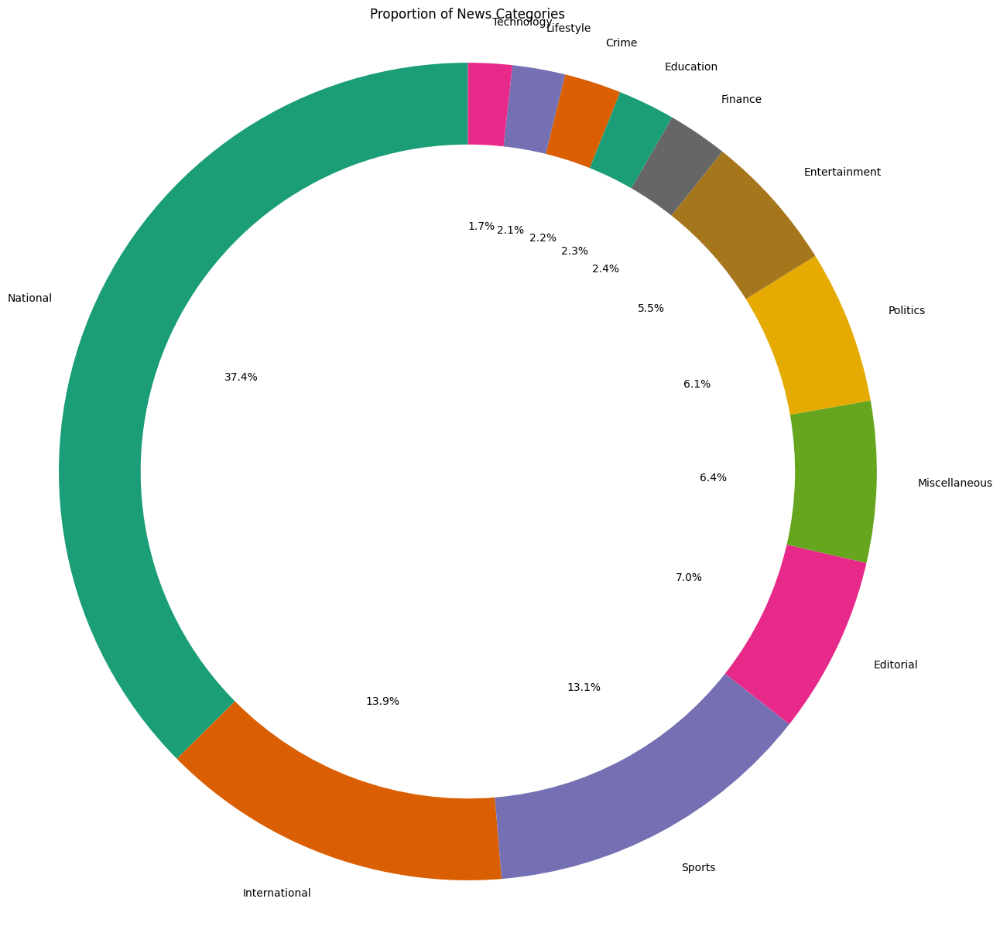

In [33]:
plt.figure(figsize=(15, 15))
colors = sns.color_palette("Dark2", len(category_counts))
plt.pie(category_counts,labels=category_counts.index,autopct='%1.1f%%',startangle=90,colors=colors,wedgeprops={'width': 0.2})
plt.title('Proportion of News Categories')
plt.axis('equal')
plt.show()

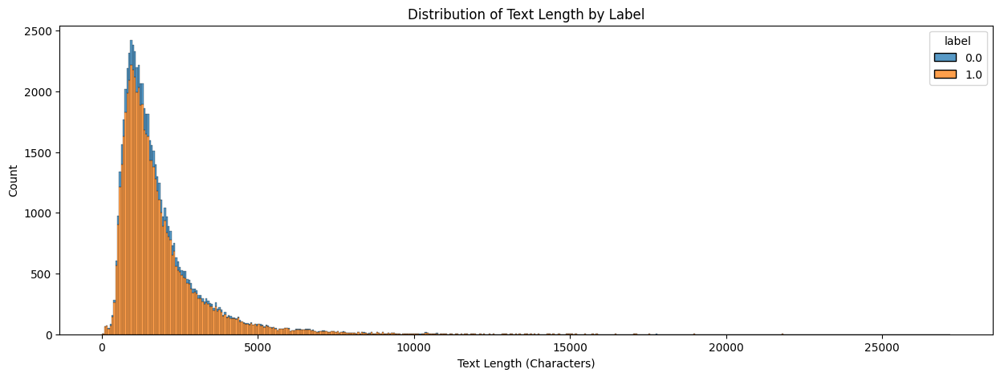

In [34]:
plt.figure(figsize=(15,5))
bn_df['text_length'] = bn_df['text'].apply(len)
sns.histplot(data=bn_df, x='text_length', hue='label', multiple='stack')
plt.title('Distribution of Text Length by Label')
plt.xlabel('Text Length (Characters)')
plt.ylabel('Count')
plt.show()

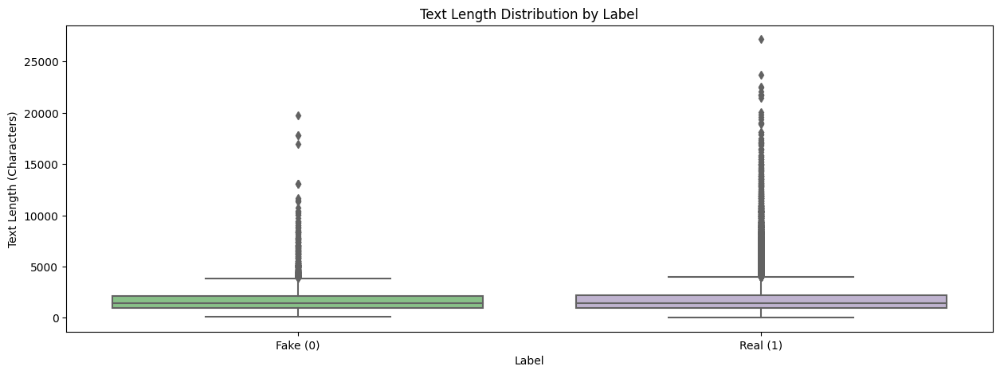

In [35]:
plt.figure(figsize=(15,5))
sns.boxplot(x='label', y='text_length', data=bn_df,palette="Accent")
plt.title('Text Length Distribution by Label')
plt.xlabel('Label')
plt.ylabel('Text Length (Characters)')
plt.xticks([0, 1], ['Fake (0)', 'Real (1)'])
plt.show()

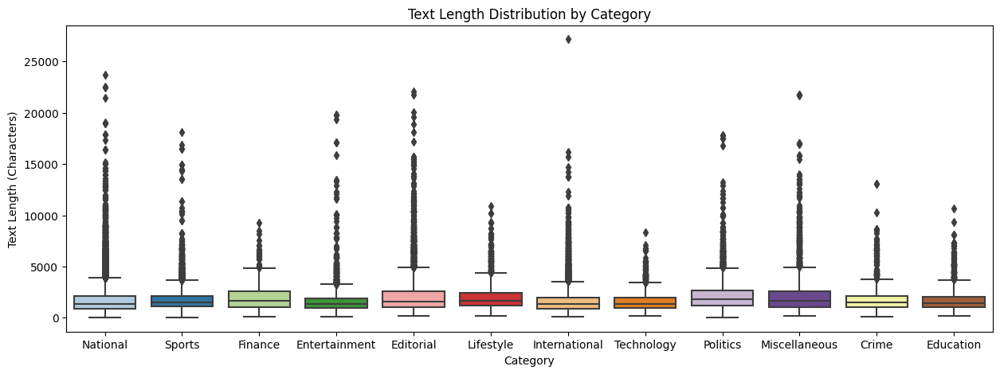

In [36]:
plt.figure(figsize=(15,5))
sns.boxplot(x='category', y='text_length', data=bn_df,palette="Paired")
plt.title('Text Length Distribution by Category')
plt.xlabel('Category')
plt.ylabel('Text Length (Characters)')
plt.show()

In [37]:
fake_df = bn_df[bn_df['label'] == 0.0]
real_df = bn_df[bn_df['label'] == 1.0].sample(n=5836, random_state=42)
new_df = pd.concat([fake_df, real_df], ignore_index=True)
bn_df = new_df.sample(frac=1, random_state=42).reset_index(drop=True)


In [38]:
with open('/kaggle/input/elegant-and-functional-fonts/stopwords-bn.txt', 'r', encoding='utf-8-sig') as f:
    stop_word = f.read()
    stop_word = stop_word.replace(" ", "")
    stop_words = stop_word.split('\n')
    print(stop_words)

['অতএব', 'অথচ', 'অথবা', 'অনুযায়ী', 'অনেক', 'অনেকে', 'অনেকেই', 'অন্তত', 'অন্য', 'অবধি', 'অবশ্য', 'অর্থাত', 'আই', 'আগামী', 'আগে', 'আগেই', 'আছে', 'আজ', 'আদ্যভাগে', 'আপনার', 'আপনি', 'আবার', 'আমরা', 'আমাকে', 'আমাদের', 'আমার', 'আমি', 'আর', 'আরও', 'ই', 'ইত্যাদি', 'ইহা', 'উচিত', 'উত্তর', 'উনি', 'উপর', 'উপরে', 'এ', 'এঁদের', 'এঁরা', 'এই', 'একই', 'একটি', 'একবার', 'একে', 'এক্', 'এখন', 'এখনও', 'এখানে', 'এখানেই', 'এটা', 'এটাই', 'এটি', 'এত', 'এতটাই', 'এতে', 'এদের', 'এব', 'এবং', 'এবার', 'এমন', 'এমনকী', 'এমনি', 'এর', 'এরা', 'এল', 'এস', 'এসে', 'ঐ', 'ও', 'ওঁদের', 'ওঁর', 'ওঁরা', 'ওই', 'ওকে', 'ওখানে', 'ওদের', 'ওর', 'ওরা', 'কখনও', 'কত', 'কবে', 'কমনে', 'কয়েক', 'কয়েকটি', 'করছে', 'করছেন', 'করতে', 'করবে', 'করবেন', 'করলে', 'করলেন', 'করা', 'করাই', 'করায়', 'করার', 'করি', 'করিতে', 'করিয়া', 'করিয়ে', 'করে', 'করেই', 'করেছিলেন', 'করেছে', 'করেছেন', 'করেন', 'কাউকে', 'কাছ', 'কাছে', 'কাজ', 'কাজে', 'কারও', 'কারণ', 'কি', 'কিংবা', 'কিছু', 'কিছুই', 'কিন্তু', 'কী', 'কে', 'কেউ', 'কেউই', 'কেখা', 'কেন', 'কোটি', 'কোন', 'কোনও'

In [39]:
emoji_pattern = re.compile(
    "["
    "\U0001F600-\U0001F64F"
    "\U0001F300-\U0001F5FF"
    "\U0001F680-\U0001F6FF"
    "\U0001F1E0-\U0001F1FF"
    "\U00002702-\U000027B0"
    "\U000024C2-\U0001F251"
    "]+",
    flags=re.UNICODE
)

bl = lm.Lemmatizer()

def clean_bangla_text(text, stop_words):
    if not isinstance(text, str) or pd.isna(text):
        return ""

    text = BeautifulSoup(text, "html.parser").get_text()
    text = emoji_pattern.sub(r'', text)
    text = text.replace('\n', ' ').replace('\t', ' ').replace('\\', '')
    text = re.sub(r'[!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~।!]', '', text)
    text = re.sub(r'[০-৯0-9]', '', text)
    text = re.sub(r'[a-zA-Z]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()

    if not text:
        return ""

    lemmatized_words = []
    for word in text.split():
        try:
            if isinstance(word, str):
                lemmatized = bl.lemma(word)
                lemmatized_words.append(lemmatized)
            else:
                lemmatized_words.append(word)
        except Exception:
            lemmatized_words.append(word)  # Safely fallback

    filtered_words = [word for word in lemmatized_words if word not in stop_words]
    return ' '.join(filtered_words)

tqdm.pandas()
bn_df["text"] = bn_df["text"].progress_apply(lambda x: clean_bangla_text(x, stop_words))

  0%|          | 0/11672 [00:00<?, ?it/s]

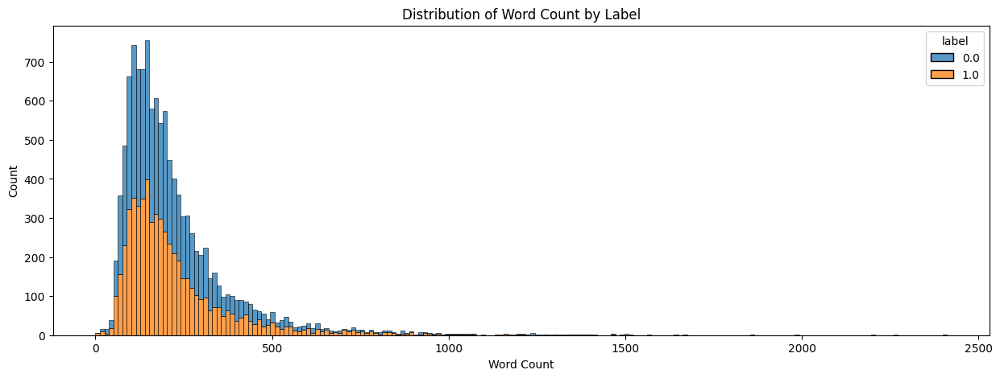

In [40]:
tokenizer = BasicTokenizer(False)

bn_df['word_count'] = bn_df['text'].apply(lambda x: len(tokenizer.tokenize(x)))

plt.figure(figsize=(15, 5))
sns.histplot(data=bn_df, x='word_count', hue='label', multiple='stack')
plt.title('Distribution of Word Count by Label')
plt.xlabel('Word Count')
plt.ylabel('Count')
plt.show()

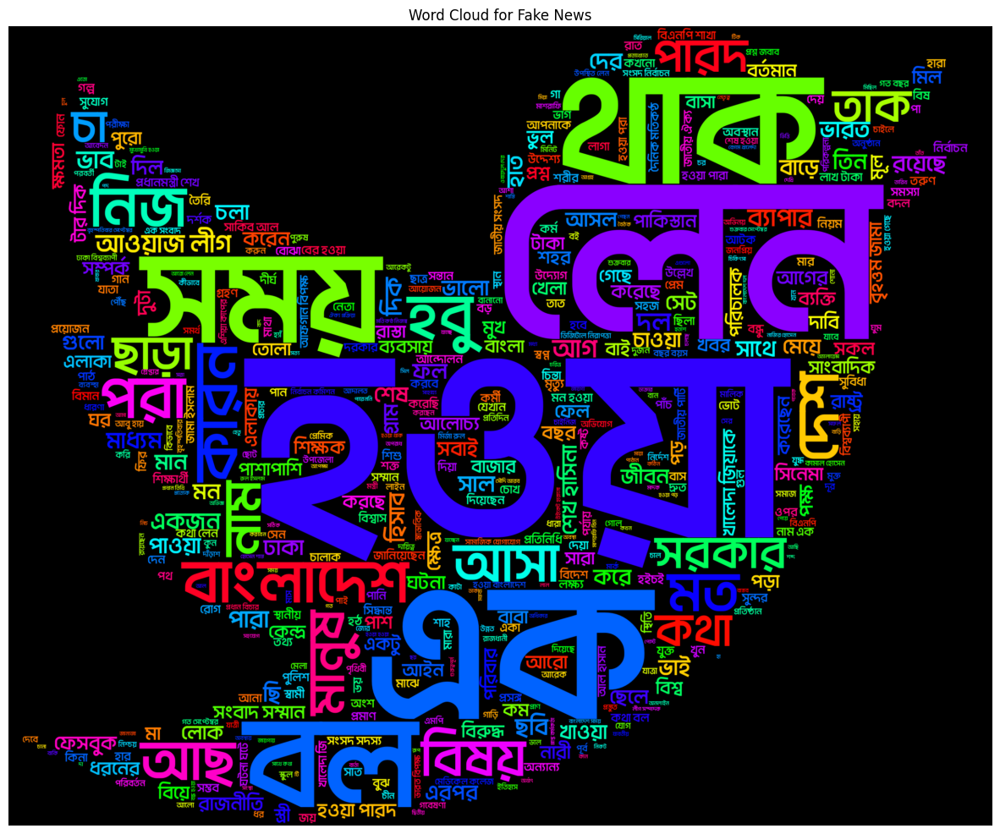

In [41]:
plt.figure(figsize=(15,15))
fake_text = ' '.join(bn_df[bn_df['label'] == 0.0]['text'])
regex = r"[\u0980-\u09FF]+"
wordcloud = WordCloud(font_path=my_font,width=800,height=800, background_color='black',regexp=regex,colormap="hsv",
                      max_words=500,mask=wordcloud_mask,stopwords=set(stop_word)).generate(fake_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Fake News')
plt.show()

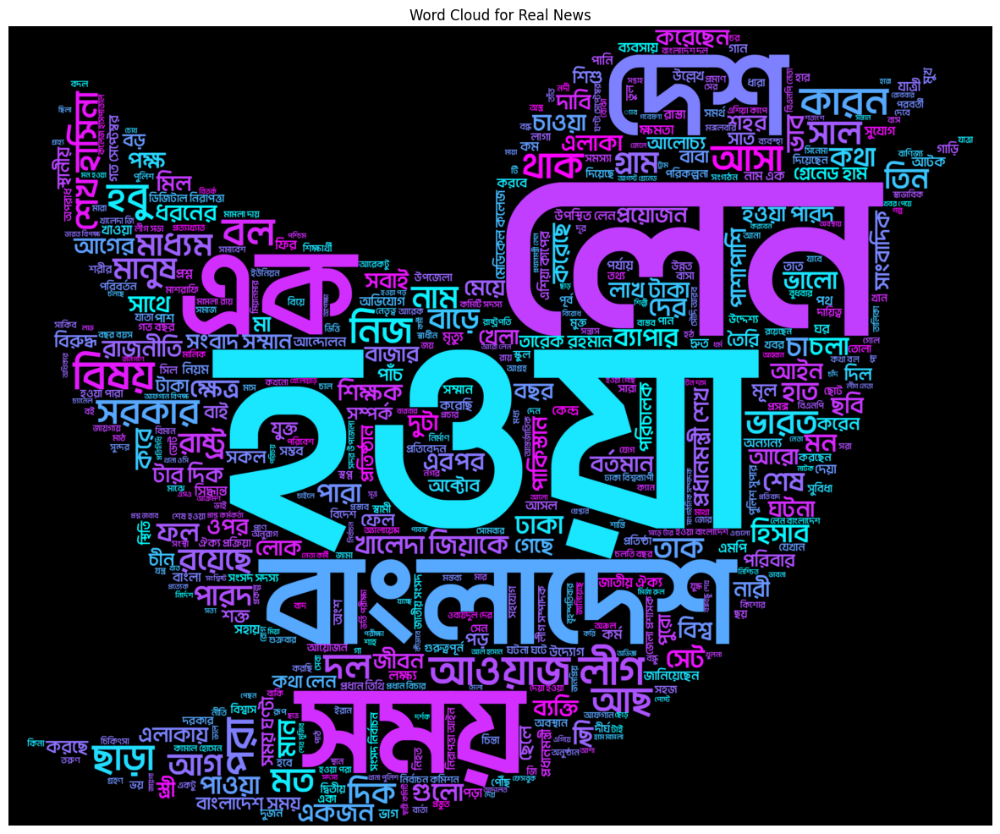

In [42]:
plt.figure(figsize=(15,15))
real_text = ' '.join(bn_df[bn_df['label'] == 1.0]['text'])
regex = r"[\u0980-\u09FF]+"
wordcloud = WordCloud(font_path=my_font,width=800,height=800, background_color='black',regexp=regex,colormap="cool",
                      max_words=500,mask=wordcloud_mask, stopwords=set(stop_word)).generate(real_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Real News')
plt.show()

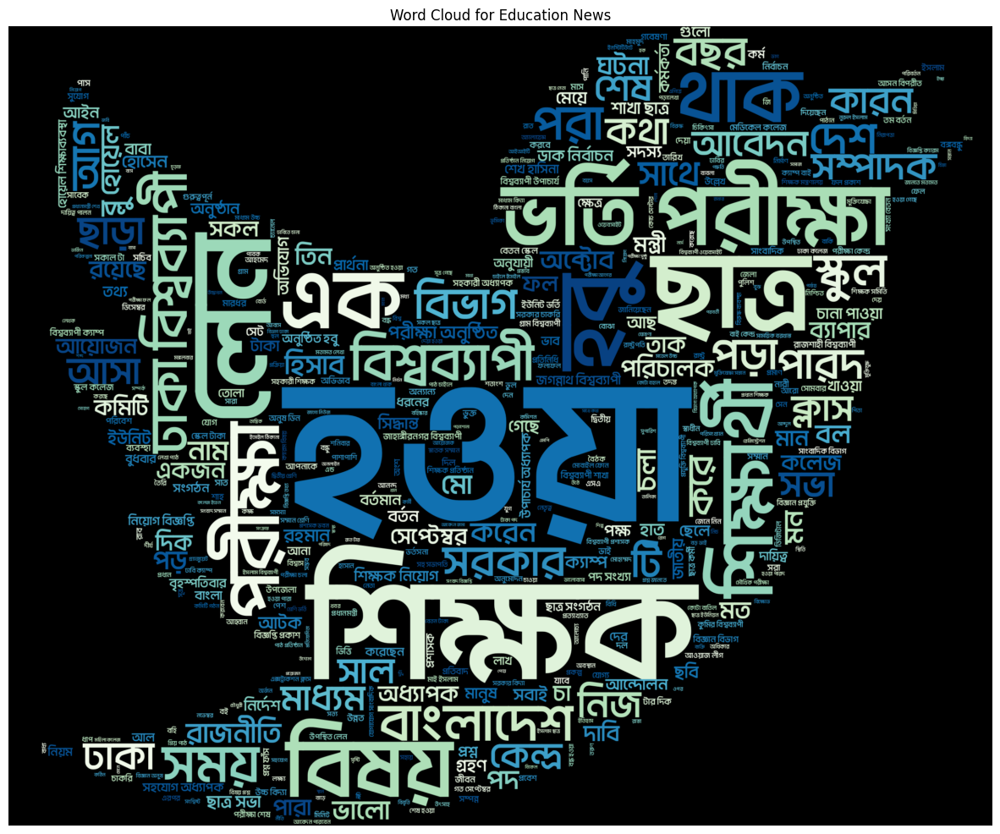

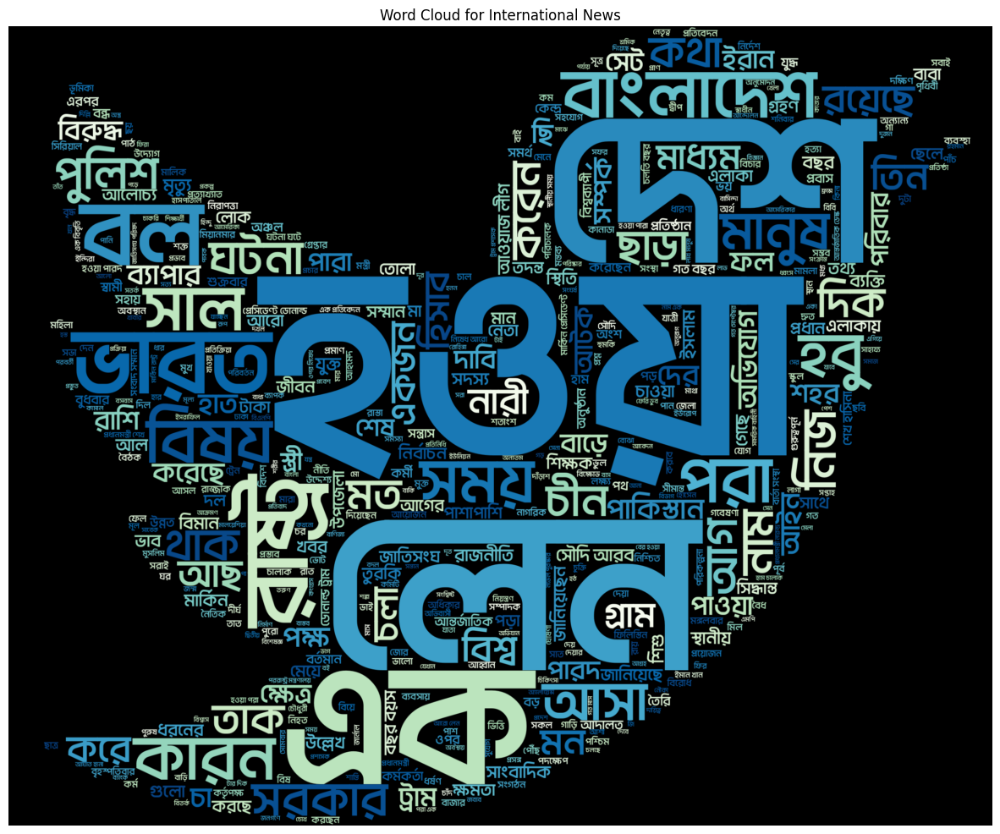

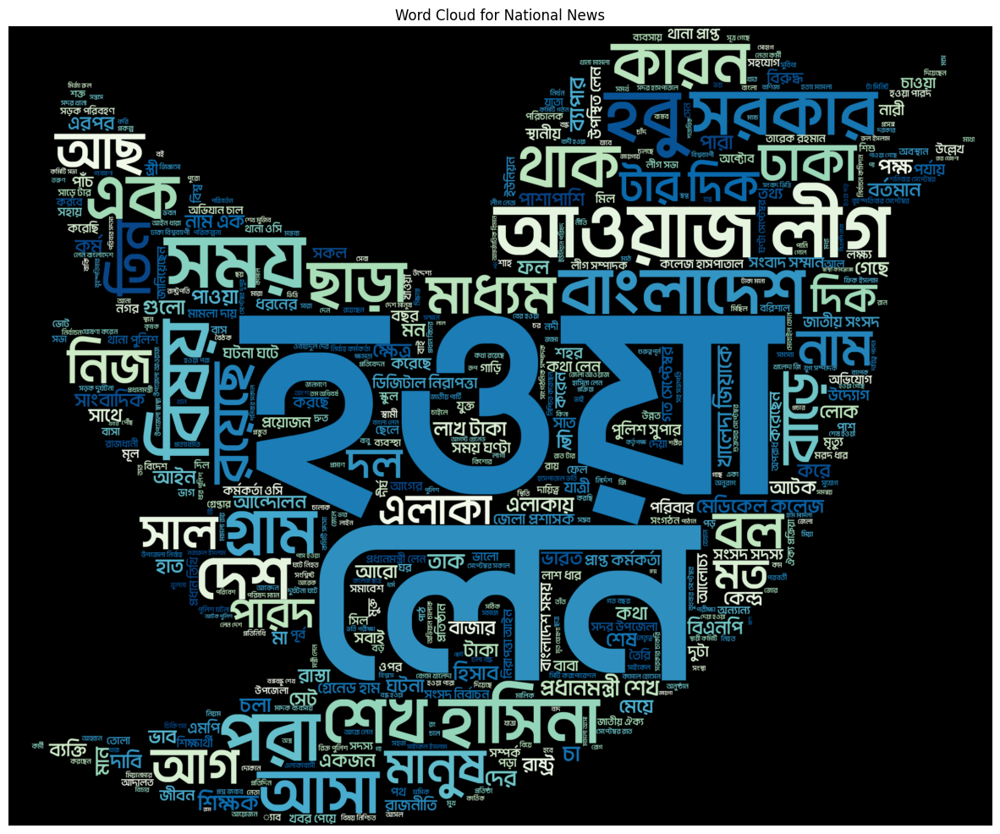

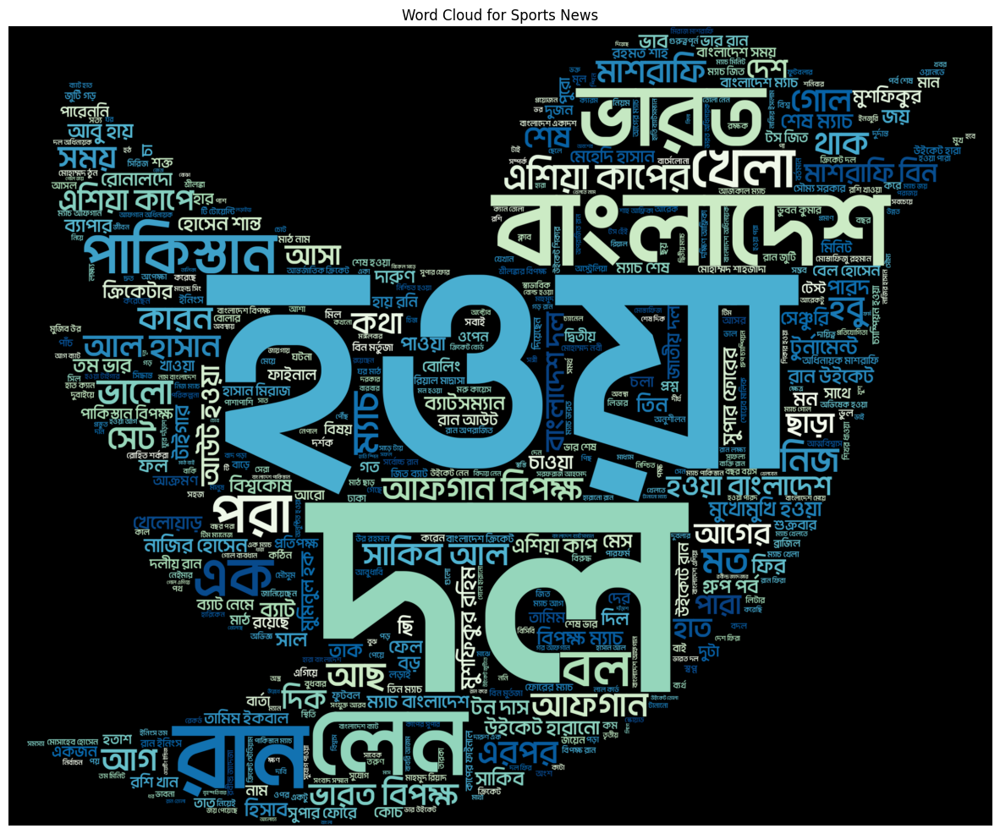

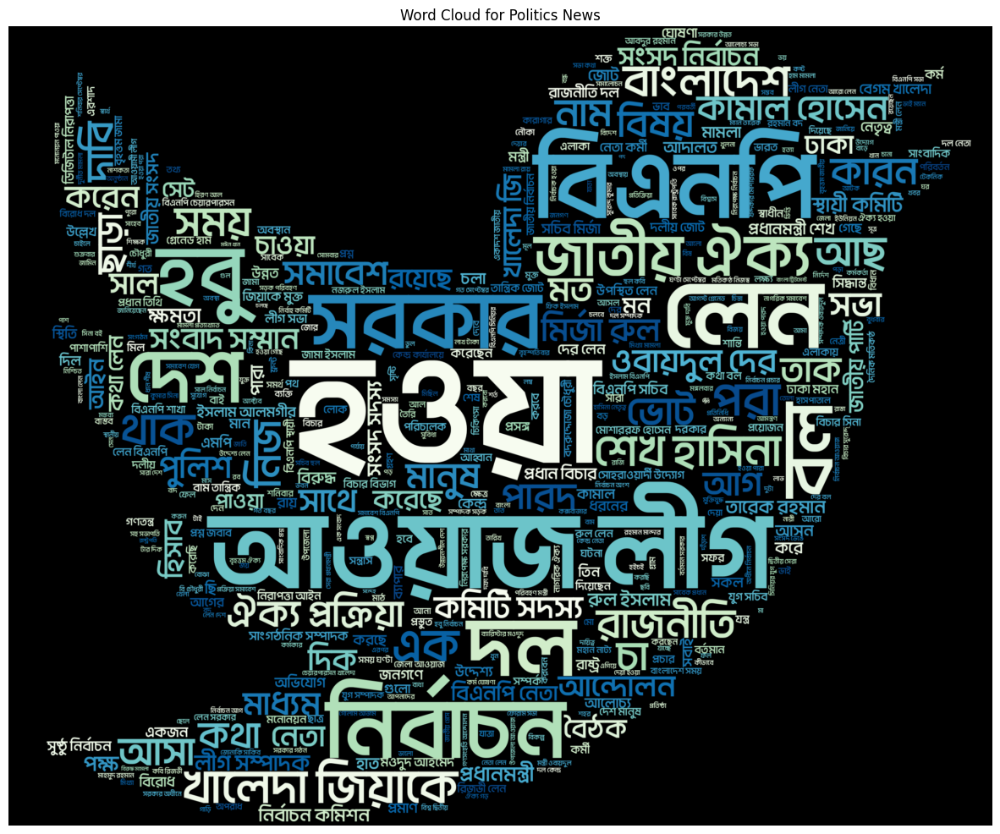

...

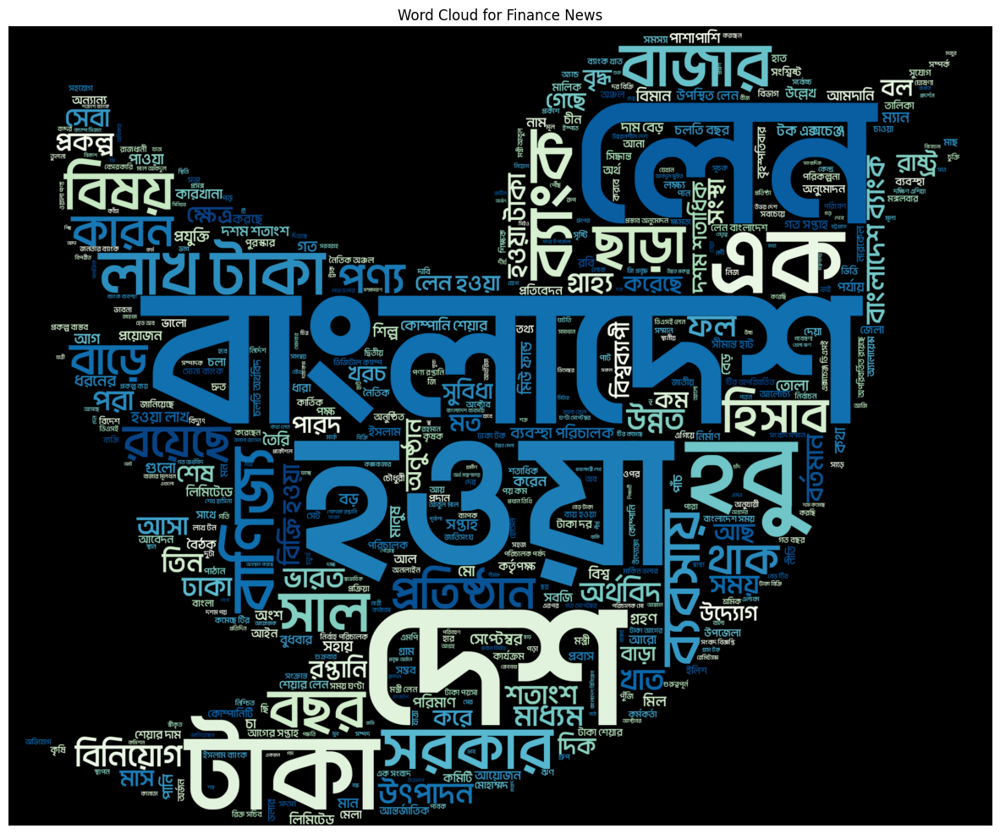

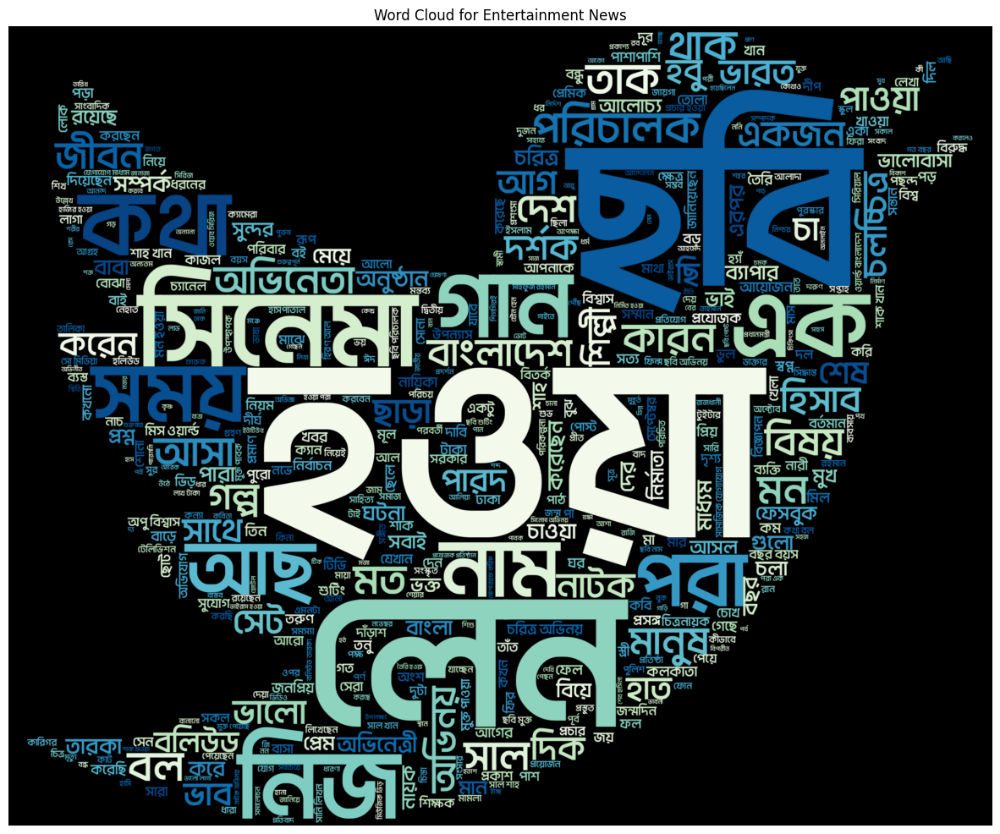

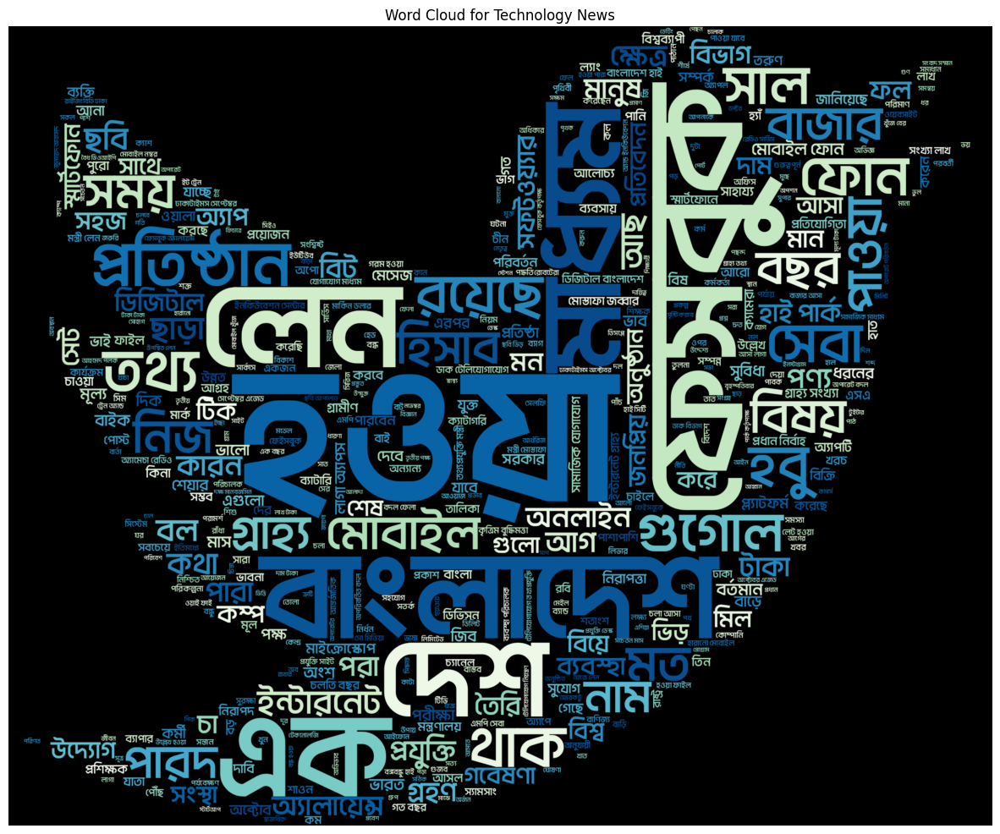

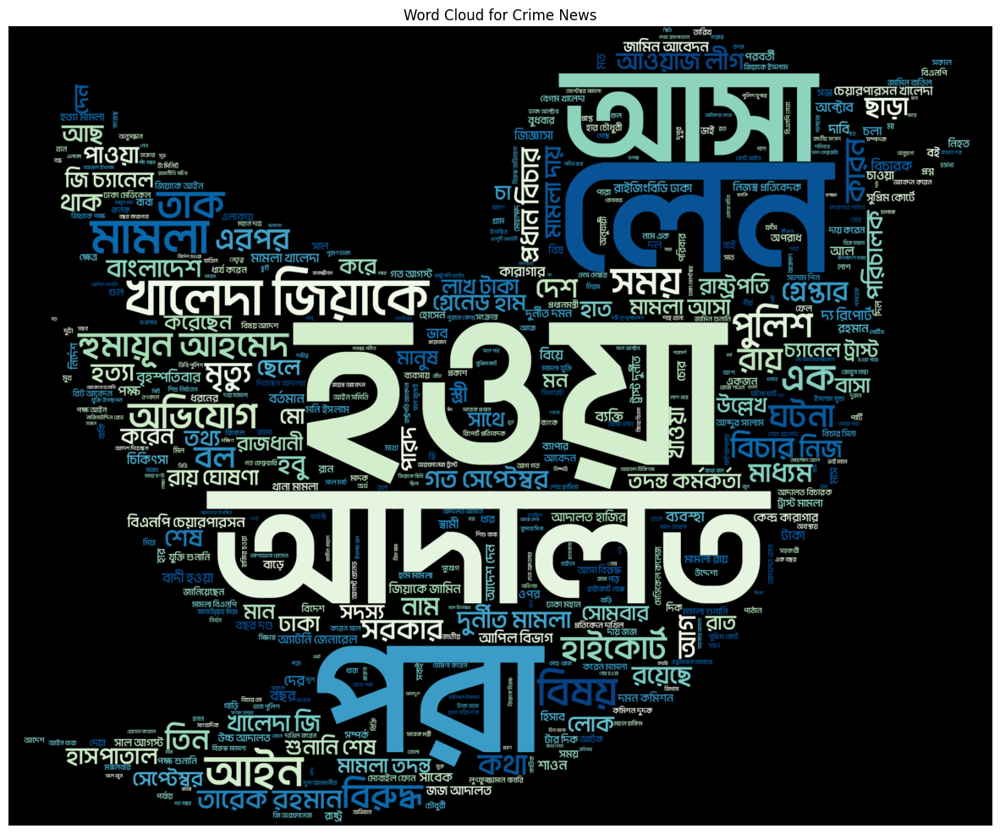

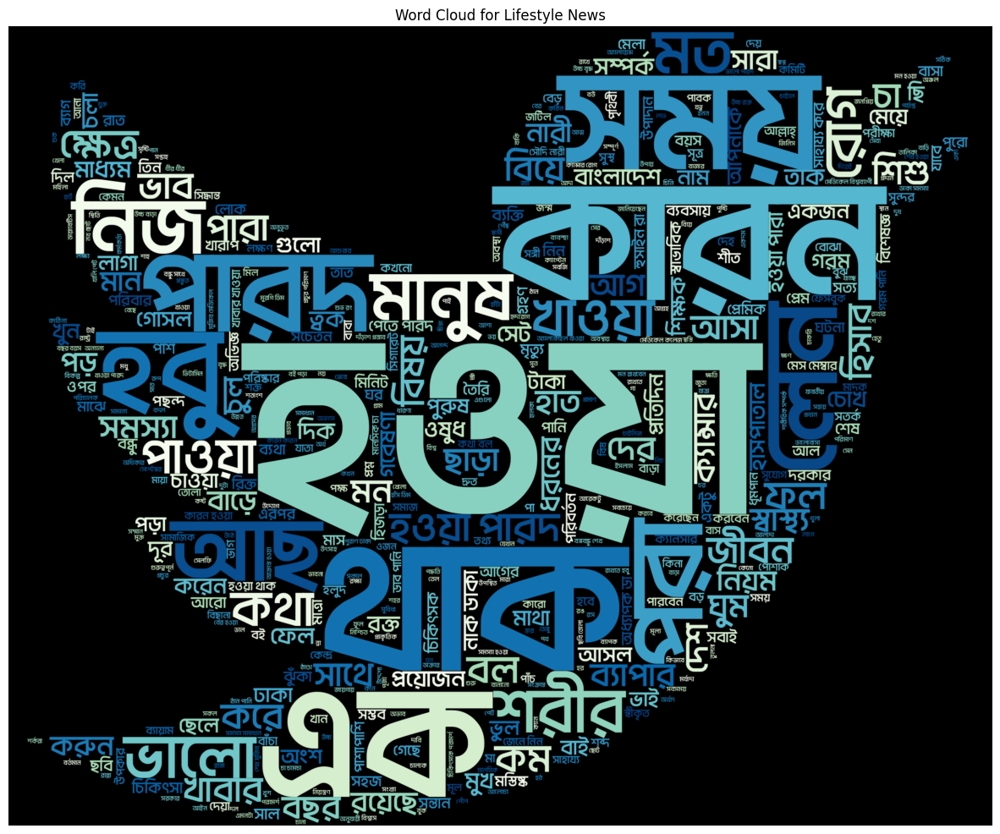

In [43]:
for category in bn_df['category'].unique():
    category_text = ' '.join(bn_df[bn_df['category'] == category]['text'])
    wordcloud = WordCloud(font_path=my_font, background_color='black',max_words=500,width=800,height=800,
                         regexp=regex,colormap="GnBu",mask=wordcloud_mask, stopwords=set(stop_word)).generate(category_text)
    plt.figure(figsize=(15,15))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {category} News')
    plt.show()

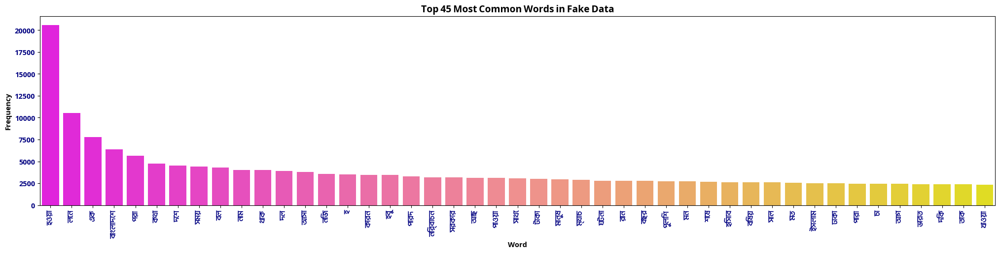

In [44]:
import matplotlib.font_manager as fm

my_font = fm.FontProperties(fname="/kaggle/input/elegant-and-functional-fonts/Ador Noirrit Web.otf")
fake_data = bn_df[bn_df["label"] == 0.0]["text"]
top_words = fake_data.str.split(expand=True).stack().value_counts().head(45)
plt.figure(figsize=(25,5))
sns.barplot(x=top_words.index, y=top_words.values, palette="spring")
plt.title('Top 45 Most Common Words in Fake Data', fontproperties=my_font, fontsize=20, color="black")
plt.xlabel('Word', fontproperties=my_font, fontsize=15, color="black")
plt.ylabel('Frequency', fontproperties=my_font, fontsize=15, color="black")
plt.xticks(rotation=90, fontproperties=my_font, fontsize=15, color="navy")
plt.yticks(fontproperties=my_font, fontsize=15, color="navy")
plt.show()

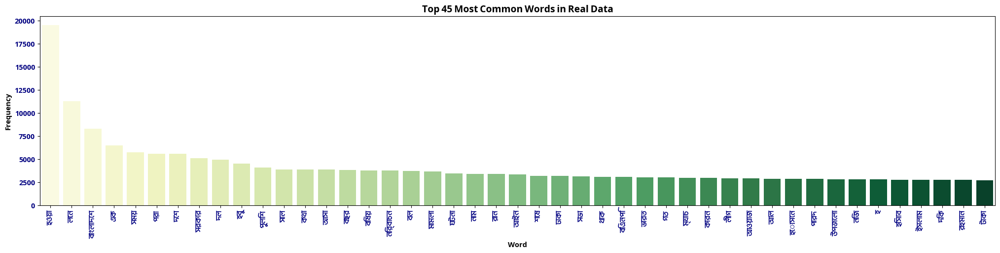

In [45]:
my_font = fm.FontProperties(fname="/kaggle/input/elegant-and-functional-fonts/Ador Noirrit Web.otf")
real_data = bn_df[bn_df["label"] == 1.0]["text"]
top_words = real_data.str.split(expand=True).stack().value_counts().head(45)
plt.figure(figsize=(25,5))
sns.barplot(x=top_words.index, y=top_words.values, palette="YlGn")
plt.title('Top 45 Most Common Words in Real Data', fontproperties=my_font, fontsize=20, color="black")
plt.xlabel('Word', fontproperties=my_font, fontsize=15, color="black")
plt.ylabel('Frequency', fontproperties=my_font, fontsize=15, color="black")
plt.xticks(rotation=90, fontproperties=my_font, fontsize=15, color="navy")
plt.yticks(fontproperties=my_font, fontsize=15, color="navy")
plt.show()

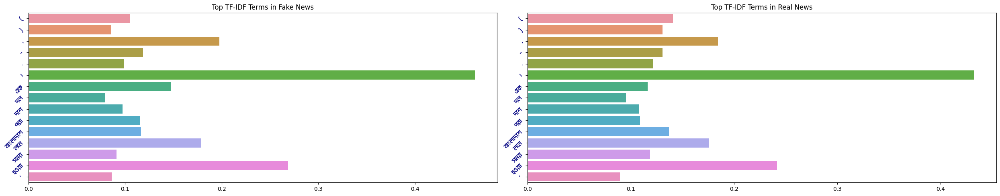

In [46]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(tokenizer=tokenizer.tokenize, stop_words=stop_words, max_features=15)
tfidf_matrix = tfidf.fit_transform(bn_df['text'])
feature_names = tfidf.get_feature_names_out()

fake_tfidf = tfidf_matrix[bn_df['label'] == 0.0].mean(axis=0).A1
real_tfidf = tfidf_matrix[bn_df['label'] == 1.0].mean(axis=0).A1

plt.figure(figsize=(25, 5))
plt.subplot(1, 2, 1)
sns.barplot(x=fake_tfidf, y=feature_names)
plt.title('Top TF-IDF Terms in Fake News')
plt.yticks(rotation=45, fontproperties=my_font, fontsize=15, color="navy")
plt.subplot(1, 2, 2)
sns.barplot(x=real_tfidf, y=feature_names)
plt.title('Top TF-IDF Terms in Real News')
plt.yticks(rotation=45, fontproperties=my_font, fontsize=15, color="navy")
plt.tight_layout()
plt.show()

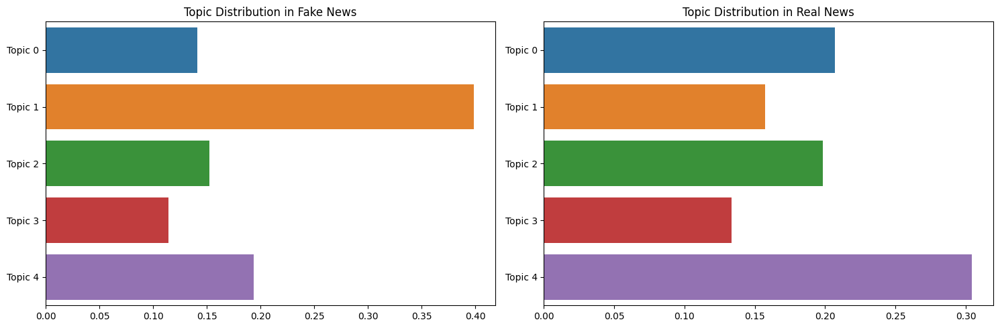

In [47]:
from sklearn.decomposition import LatentDirichletAllocation
tfidf = TfidfVectorizer(tokenizer=tokenizer.tokenize, stop_words=stop_words, max_features=1000)
tfidf_matrix = tfidf.fit_transform(bn_df['text'])
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda_matrix = lda.fit_transform(tfidf_matrix)

fake_topics = lda_matrix[bn_df['label'] == 0.0].mean(axis=0)
real_topics = lda_matrix[bn_df['label'] == 1.0].mean(axis=0)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.barplot(x=fake_topics, y=[f'Topic {i}' for i in range(5)])
plt.title('Topic Distribution in Fake News')
plt.subplot(1, 2, 2)
sns.barplot(x=real_topics, y=[f'Topic {i}' for i in range(5)])
plt.title('Topic Distribution in Real News')
plt.tight_layout()
plt.show()

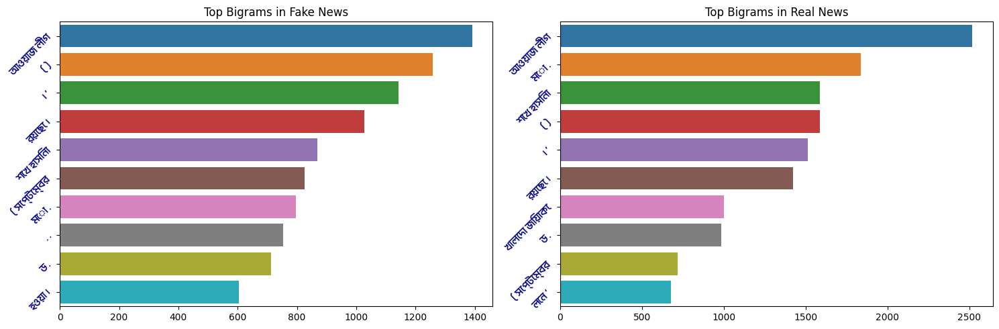

In [48]:
from nltk import ngrams
from collections import Counter


def get_top_ngrams(text_series, n=2, top_k=10):
    all_ngrams = []
    for text in text_series:
        words = tokenizer.tokenize(text)
        words = [word for word in words if word not in stop_words]
        all_ngrams.extend([' '.join(gram) for gram in ngrams(words, n)])
    return Counter(all_ngrams).most_common(top_k)

fake_bigrams = get_top_ngrams(bn_df[bn_df['label'] == 0.0]['text'], n=2)
real_bigrams = get_top_ngrams(bn_df[bn_df['label'] == 1.0]['text'], n=2)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.barplot(x=[count for _, count in fake_bigrams], y=[gram for gram, _ in fake_bigrams])
plt.yticks(rotation=45, fontproperties=my_font, fontsize=15, color="navy")
plt.title('Top Bigrams in Fake News')
plt.subplot(1, 2, 2)
sns.barplot(x=[count for _, count in real_bigrams], y=[gram for gram, _ in real_bigrams])
plt.yticks(rotation=45, fontproperties=my_font, fontsize=15, color="navy")
plt.title('Top Bigrams in Real News')
plt.tight_layout()
plt.show()

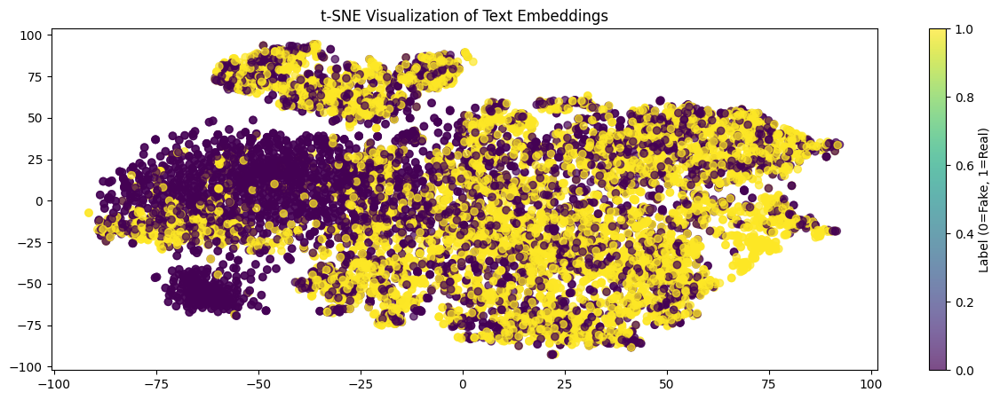

In [49]:
import numpy as np
from gensim.models import FastText
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

sentences = [tokenizer.tokenize(text) for text in bn_df['text']]
model = FastText(sentences, vector_size=100, window=5, min_count=1)

def get_text_embedding(text_tokens):
    vectors = [model.wv[word] for word in text_tokens if word in model.wv]
    if len(vectors) == 0:
        return np.zeros(model.vector_size)
    else:
        return np.mean(vectors, axis=0)

embeddings = np.array([get_text_embedding(tokenizer.tokenize(text)) for text in bn_df['text']])

tsne = TSNE(n_components=2, random_state=42)
tsne_embeddings = tsne.fit_transform(embeddings)

plt.figure(figsize=(15, 5))
plt.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], c=bn_df['label'], cmap='viridis', alpha=0.7)
plt.colorbar(label='Label (0=Fake, 1=Real)')
plt.title('t-SNE Visualization of Text Embeddings')
plt.show()


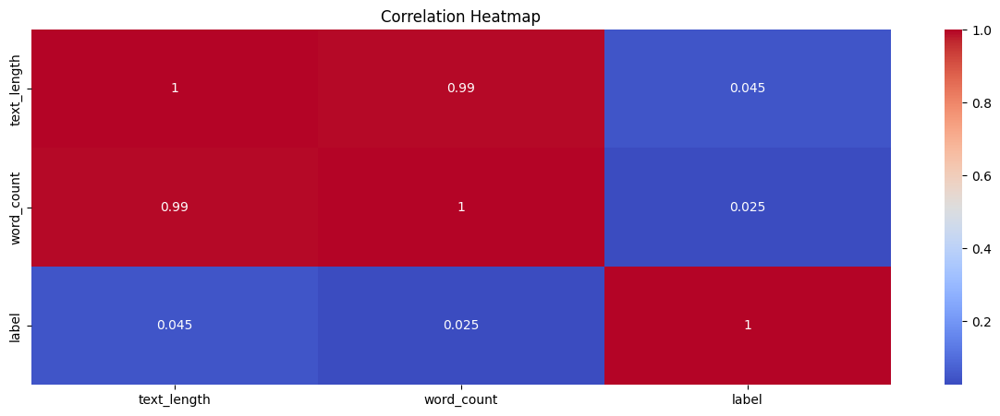

In [50]:
plt.figure(figsize=(15,5))
bn_df['text_length'] = bn_df['text'].apply(len)
bn_df['word_count'] = bn_df['text'].apply(lambda x: len(tokenizer.tokenize(x)))
correlation_matrix = bn_df[['text_length', 'word_count', 'label']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [51]:
bn_df.drop(columns=["category","text_length","word_count"],axis=1,inplace=True)


In [52]:
bn_df["label"]=bn_df["label"].astype(int)

In [53]:
bn_df.to_csv("cleanbn_fakenews.csv",index=False)